In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os
import plotly.express as px

import sklearn.datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix

from random import randint

In [2]:
# Input data files consisting of the images
data = sklearn.datasets.fetch_olivetti_faces()

In [3]:
images = data["data"]
labels = data['target']

print("There are {} images".format(len(images)))
print("Image Dimensionality: {}".format(images.shape[1]))
print("There are {} unique people".format(len(np.unique(labels))))


There are 400 images
Image Dimensionality: 4096
There are 40 unique people


In [4]:
# height and width of the image
height = 64  
width = 64


### Showing 40 unique faces

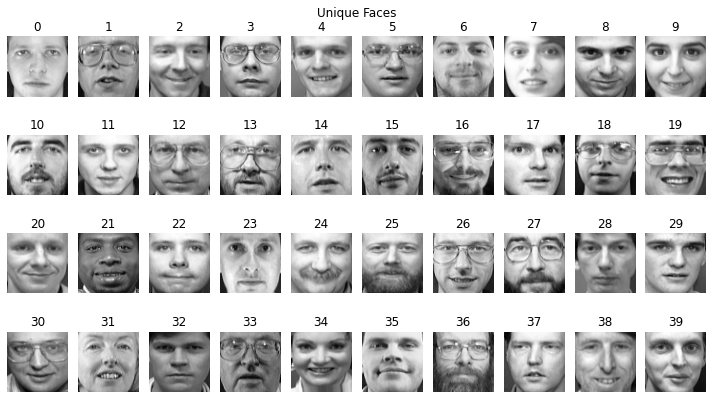

In [88]:
#showing the 40 people. Images chosen at random

fig = plt.figure(figsize=(10,6))

for i in range(40):
		
	ax = fig.add_subplot(4,10,i+1)
	ax.set_axis_off()
	plt.tight_layout()
	ax.set_title(i)
	ax.imshow(images[10*i].reshape(width,height), cmap='gray')

plt.suptitle("Unique Faces")	
plt.show()

### Showing the 10 faces of a random target

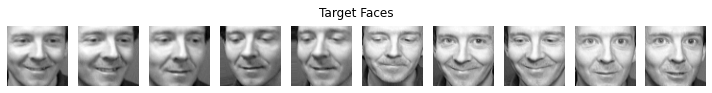

In [12]:
fig = plt.figure(figsize=(10,6))
for i in range(10):
		
	ax = fig.add_subplot(4,10,i+1)
	ax.set_axis_off()
	plt.tight_layout()
	
	ax.imshow(images[20+i].reshape(width,height), cmap='gray')

plt.suptitle("Target Faces")	
plt.show()

## Splitting the images into training and testing images.
split ratio: 30:70 for test and training



In [15]:
training_matrix, testing_matrix, y_train, y_test=train_test_split(images, labels, test_size=0.3, stratify=labels, random_state=0)
print("Total Training Images: {}".format(len(training_matrix)))
print("Shape of Training matrix: {}".format(training_matrix.shape))

print("Total Testing Images: {}".format(len(testing_matrix)))
print("Shape of Testing matrix: {}".format(testing_matrix.shape))

Total Training Images: 280
Shape of Training matrix: (280, 4096)
Total Testing Images: 120
Shape of Testing matrix: (120, 4096)


In [16]:
## Since the training matrix is m by n^2, we transpose the matrix
training_matrix = training_matrix.transpose()
testing_matrix = testing_matrix.transpose()

## Mean face
For every image, we create a column vector  $I_i$ where $1\leq i \leq m$ such that,
$I_i = \begin{aligned}\begin{bmatrix}
           i_{1} \\
           i_{2} \\
           \vdots \\
           i_{n \times n}
         \end{bmatrix}
         \end{aligned}$
For each image vector we create a matrix of images $A$ where, 
$$A = [I_1, I_2,..., I_m]$$

Computing the mean vector for each $I_i$ in A
$$\mu = \frac{1}{m} \sum_{i - 1}^{m}A_i$$
$$mean\_matrix / normalized\_faces = A_i - \mu$$

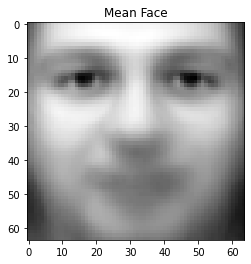

In [17]:
mean = np.zeros((1,height*width))
n = np.shape(training_matrix)[1]

for i in range(n):
	mean = np.add(mean, training_matrix[:,i])

#dividing by n
for i,data in enumerate(mean[0]):
	mean[0][i]= float(data/n)

plt.imshow(mean[0].reshape(width, height), cmap='gray')
plt.title("Mean Face")
plt.show()

### Showing random images
Function: Shows $n$ random images from a given image matrix 

In [124]:
def show_random_images(rows=2, cols=10, num=20,data_matrix= None, array_range = 280, title = ""):
	'''
	args:
	rows, cols: numbe of rows and columns for the subplots
	num: number of images
	data_matrix: training or testing or normal matrix
	array_range: specify the index of the image matrix
	title: title of the plot
	
	output: random images
	'''
	figure, ax = plt.subplots(nrows=rows,ncols=cols, figsize = (15,6))
	for i in range(num):
		normal_img = data_matrix[:,randint(0,array_range-1)].reshape(width,height)
		ax.ravel()[i].imshow(normal_img, cmap='gray')
		ax.ravel()[i].set_axis_off()
		plt.tight_layout()
		plt.suptitle(title, size = 15)
		plt.subplots_adjust(top=1.1)
	plt.show()

## Normalization
Normalizes training or testing matrix such that:

$$mean\_matrix / normalized\_faces = A_i - \mu$$ 
where,   
$$\mu = \frac{1}{m} \sum_{i - 1}^{m}A_i$$

In [126]:
## A - mu
def normalization(matrix, plots = False):
	'''
	args: matrix =  training or testing matrix
	plot: True or False default False

	Function: subtracts the mean form the input matrix

	Output: if plots = True shows 20 random normalized faces
	Returns: normalization_matrix 
	'''

	normalization_matrix = np.ndarray(shape=(height*width, np.shape(matrix)[1]))
	for i in range(np.shape(matrix)[1]):
		normalization_matrix[:,i] = np.subtract(matrix[:,i],mean)
	print("Shape: {}".format(normalization_matrix.shape))
	
	return normalization_matrix

	

Shape: (4096, 280)


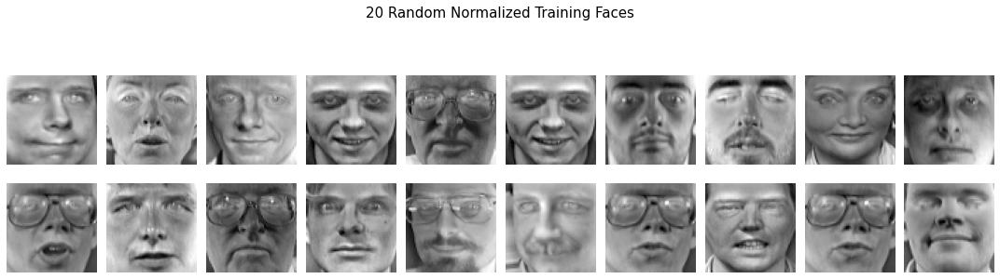

In [127]:
normalized_training_matrix = normalization(training_matrix)
show_random_images(rows=2, cols=10, num=20,data_matrix= normalized_training_matrix, array_range=280, title = "20 Random Normalized Training Faces")

Shape: (4096, 120)


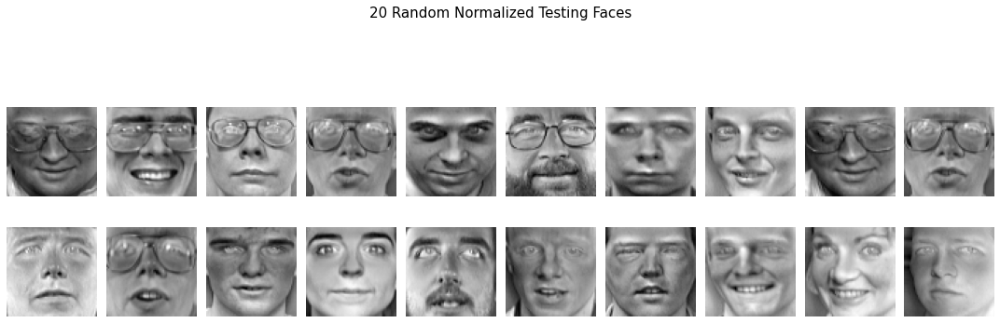

In [21]:
normalized_testing_matrix = normalization(testing_matrix)
show_random_images(rows=2, cols=10, num=20,data_matrix= normalized_testing_matrix, array_range=normalized_testing_matrix.shape[1], title = "20 Random Normalized Testing Faces")

## Computing covariance matrix $AA^T$
$A$ is $n^2 \times m$ matrix
$A^T$ is $m \times n^2$ matrix

$AA^T$ is a $n^2 \times n^2$ matrix so computing $AA^T$ is inefficient.  
Thus, we compute $A^TA$ matrix of size $m \times m$.

In [22]:
cov_matrix = np.cov(normalized_training_matrix.transpose())
cov_matrix = np.divide(cov_matrix,np.shape(normalized_training_matrix)[1])


fig = px.imshow(cov_matrix,labels = dict(color = "Viridis"))
fig.show()


## Computing the eigenvectors and eigen values of the reduced covairance matrix and mappig them to $AA^T$
$A^TA v_i = c_i v_i$ where $c_i$ is the eigenvalue correspoinding to the eigenvector $v_i$.  
Note: $A^TA$ and $AA^T$ have the same eigen values while the eigen vectors are related by the equation $u_i = Av_i$ where, $u_i = N^2 \times 1$.  
Before mapping the eigen vectors to $AA^T$, we first do the PCA and choose the approproiate number of principle components(makes the whole process easier).

Note: In numpy eigenvectors are the column vectors 

In [23]:
eigen_val, eigen_vec = np.linalg.eig(cov_matrix)
## mapping eigenvec to eigneval 
eigen_pairs = []
for i, values in enumerate(eigen_val):
	buffer = []
	buffer = [values,eigen_vec[:,i]]
	
	eigen_pairs.append(buffer)

eigen_pairs.sort(key=lambda tup: tup[0], reverse=True)
print(eigen_pairs)


[[0.002587435296829852, array([ 0.06225826,  0.04267861,  0.12411344,  0.05219382,  0.04449373,
       -0.100319  , -0.03743754,  0.03224161,  0.03027504, -0.04620414,
        0.00392442,  0.20533482, -0.00201707, -0.13062747,  0.03736265,
        0.03055309, -0.04598055,  0.07541554, -0.04432339, -0.03110558,
        0.06942857,  0.08223615,  0.04041327, -0.03618118,  0.05379799,
       -0.04736419, -0.03156288,  0.06419713,  0.01956402, -0.012428  ,
        0.05618059,  0.04092142,  0.03272063, -0.00190504,  0.03519891,
       -0.06960851,  0.07721462, -0.11017977, -0.09734906, -0.10034656,
        0.0956049 ,  0.03487596,  0.04253012, -0.00341018,  0.01346349,
        0.04727903,  0.08008831, -0.01363593,  0.00895591, -0.02767274,
        0.0143645 ,  0.02813919, -0.12567694, -0.00453321, -0.05141951,
        0.02804645, -0.06157606,  0.0646308 , -0.09422047, -0.04016446,
        0.04607254,  0.01177463, -0.05658737,  0.03463862, -0.02620136,
        0.00521564,  0.03085911,  0.0108

## PCA
Recall: the eigenvalues of the priciple components are the variances of the covairance matrix i.e the diagonal entries. 
As the eigevalues become smaller and samaller, the variation decreases hence, we can choose eignevectors with high eigenvalues to represent our data. But, what number of eigenvalue-vector pair($k$) contribute to the PC?  
We plot the cumulative sum of eigenvalues. Then, $k$ = The point at which the curve levels up.


In [25]:
pca_confidence = 0.96  #change here to vary the confidence(int/float)
def pca(pca_confidence):
	'''
	args: 
	pca_confidence: default= 1. Number between 0-1. To choose the number of principle components from the cumulative variance. 0 is leeast and 1 is max.
	return: k 
	'''
	component_cumulative_sum = []
	cumulative_sum = 0
	for data in eigen_pairs:
		cumulative_sum += data[0]
		component_cumulative_sum.append(cumulative_sum)

	total = component_cumulative_sum[-1]

	fig = px.scatter(x = list(range(0,len(eigen_pairs))), y = component_cumulative_sum/total)
	fig.update_layout(
    title="Principle Component Analysis",
    xaxis_title="Principle Component",
    yaxis_title="Cumulative Variance",
    font=dict(
        size=12,
    )
)
	fig.show()

	for i, component in enumerate(component_cumulative_sum):
		if component/total >= pca_confidence:
			return i+1


k = pca(pca_confidence)   #get the value of k

In [26]:
print("k = {}".format(k))

k = 135


## Computing $u_i = A v_i$ and plotting eigen faces
Important: normalize $u_i:||u_i|| = 1$

In [78]:
def compute_u_i(k, plots = False):
	k_eigen_pair = eigen_pairs[:k]	  # choose k eigen pairs
	u_i = []

	for vectors in k_eigen_pair:
		x = np.dot(training_matrix,vectors[1])
		x = np.divide(x,np.linalg.norm(x))
		u_i.append(x)

	# print("u_i shape: {}".format(np.array(u_i).shape))
	
	## plotting the eigenfaces
	if plots == True:
		show_random_images(rows=2, cols=10, num=20,data_matrix= np.array(u_i).transpose(), array_range=np.array(u_i).shape[0], title = "20 Random EigenFaces")

	return u_i

## Findind weights for each training image
$normalized\_faces = n^2 \times m$   
$u\_i = k \times n^2$  
$w = <normalized\_faces,u\_i> = k \times m$

In [79]:
def get_w(u_i):
	w = np.array([np.dot(np.array(u_i),i) for i in normalized_training_matrix.transpose()])
	return w

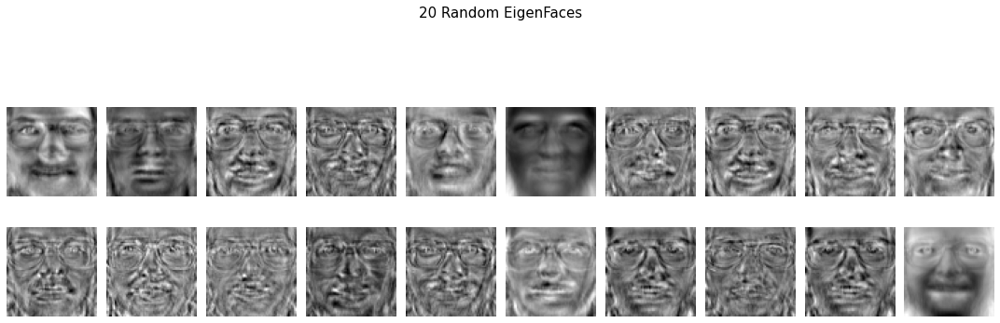

In [80]:
u_i = compute_u_i(k, plots = True)
w = get_w(u_i)


In [114]:
def recognizer(y_train,nomral_matrix, u_i, w):
	predicted_result = []
	predict_index = []
	for x in range(nomral_matrix.shape[1]):
		un = nomral_matrix[:,x]
		w_unknown = np.dot(u_i,un)
		diff = w - w_unknown
		norms = np.linalg.norm(diff, axis=1)
		# print(norms)
		# print(len(norms))
		d = min(norms)
		index = np.argmin(norms)
		# if distance != 0:
		# 	if d > distance:
		# 		predicted_result.append(x+1) #appending a false result
		# 	else:
		# 		predicted_result.append(y_train[index])
		# else:
		# 	# print(index)
		predicted_result.append(y_train[index])
		predict_index.append(index)
	return predicted_result, predict_index
		

pred, ind = recognizer(y_train,normalized_testing_matrix,u_i, w)

In [ ]:
pred_training, indexe = recognizer(y_train,normalized_training_matrix,u_i, w)

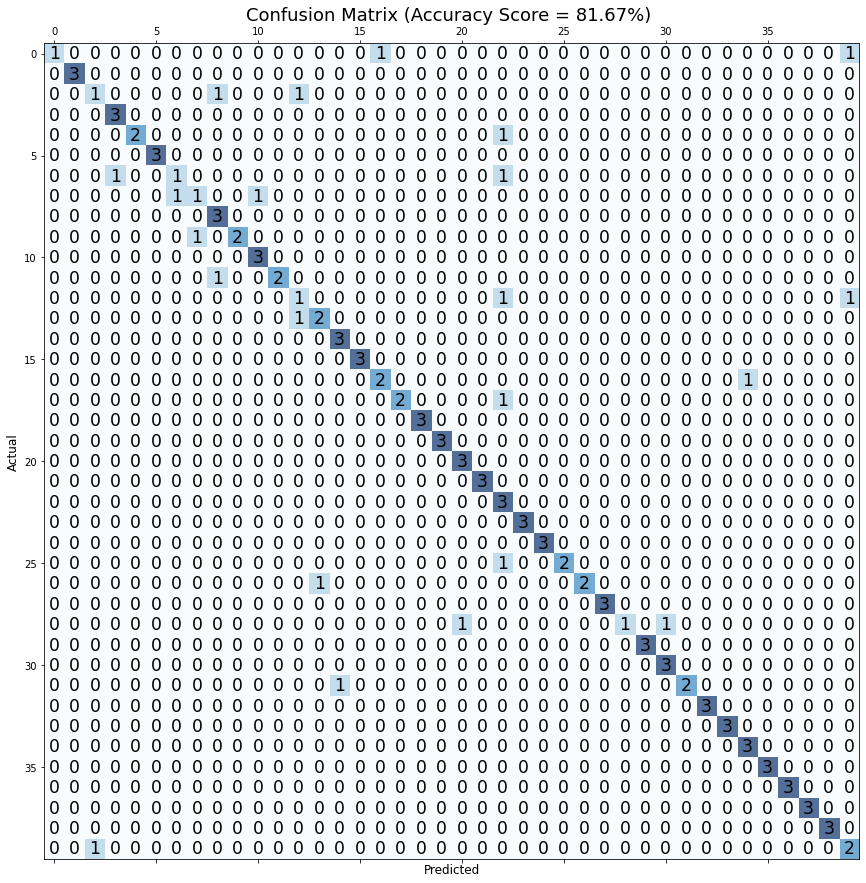

In [32]:
accuracy = accuracy_score(y_true = y_test,y_pred = pred)
conf_matrix = confusion_matrix(y_test, pred)

fig, ax = plt.subplots(figsize=(15,15))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.7)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('Actual', fontsize=12)
plt.title('Confusion Matrix (Accuracy Score = {:.2f}%) '.format(accuracy*100), fontsize=18)
plt.show()

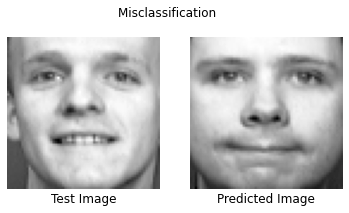

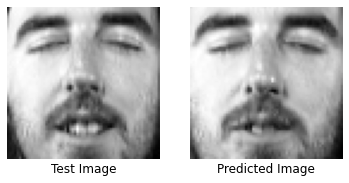

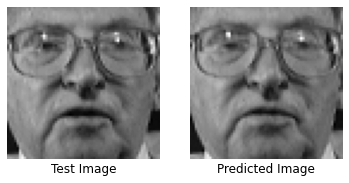

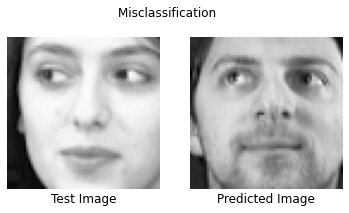

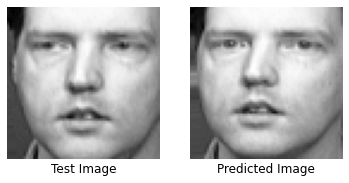

...

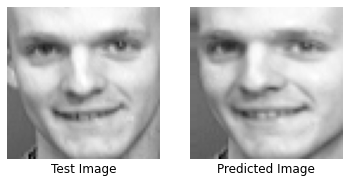

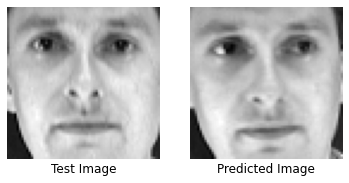

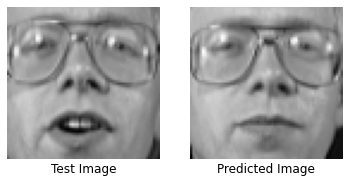

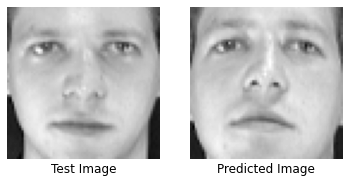

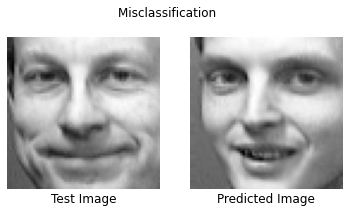

In [77]:
### Mis-classification

for i, index in enumerate(ind):
	plt1 = plt.subplot(121)
	plt1.imshow(testing_matrix[:,i].reshape(height,width),cmap='gray')
	plt1.set_title("Test Image", y=-0.13)
	plt1.set_axis_off()

	plt2 = plt.subplot(122)
	plt2.imshow(training_matrix[:,index].reshape(height,width),cmap='gray')
	plt2.set_axis_off()
	plt2.set_title("Predicted Image", y=-0.13)
	plt.subplots_adjust(top=1.1)
	if y_test[i] != pred[i]:
		plt.suptitle("Misclassification ")
		
		plt.savefig('Results/classification/mis'+str(i)+'.png')
	else:
		plt.savefig('Results/classification/'+str(i)+'.png')
	
	# plt.show()
	

### The Accuracy score analysis for different values of k

In [109]:

def k_range(normal_matrix,k_min,k_max, label_array):
	accuracy_scores = []
	for k in range (k_min,k_max):
		u_i = compute_u_i(k, plots = False)
		w = get_w(u_i)
		pred, ind = recognizer(y_train,normal_matrix,u_i, w)
		accuracy = accuracy_score(pred, label_array)
		accuracy_scores.append(accuracy)
	return accuracy_scores




In [123]:
accuracy_train = k_range(normalized_training_matrix, k_min = 1, k_max = 279, label_array = y_train)
accuracy_test = k_range(normalized_testing_matrix, k_min = 1, k_max = 279, label_array = y_test)

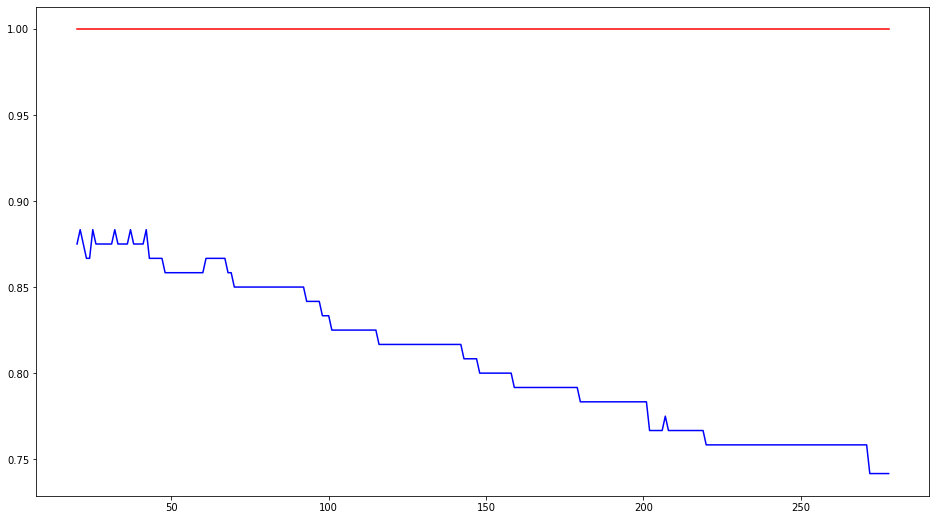

In [121]:
fig = plt.figure(figsize=(16,9))
plt.plot(range(20,279), accuracy_train, color='r')
plt.plot(range(20,279), accuracy_test, color='b')

In [ ]:
## Training and testing set analysis
